In [1]:
! pip install numpy pandas matplotlib seaborn biokit ipywidgets scikit-learn
! jupyter nbextension enable --py widgetsnbextension

In [121]:
"""
1) Index predictions are evaluated using RMSE metric

2) Energy allocation is also evaluated using RMSE metric 
"""
import os
import pandas as pd
import numpy as np
from numpy import dtype
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from collections import Counter
import seaborn as sns
sns.set(color_codes=True)
import ipywidgets as widgets
from ipywidgets import interact, interact_manual
from biokit.viz import corrplot
import math

In [2]:
root_dir = os.path.join(os.getcwd(), '..')
data_dir = os.path.join(root_dir, 'data')
train = pd.read_csv(os.path.join(data_dir, 'train.csv'))
# submited data
test = pd.read_csv(os.path.join(data_dir, 'test.csv'))

In [3]:
train.shape, test.shape

((3865, 80), (890, 79))

In [4]:
print(train.dtypes)
print()
print('unique types:', train.dtypes.unique())

galactic year                                                                  int64
galaxy                                                                        object
existence expectancy index                                                   float64
existence expectancy at birth                                                float64
Gross income per capita                                                      float64
                                                                              ...   
Adjusted net savings                                                         float64
Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total    float64
Private galaxy capital flows (% of GGP)                                      float64
Gender Inequality Index (GII)                                                float64
y                                                                            float64
Length: 80, dtype: object

unique types: [dtype('int64') dtype('O

In [5]:
f'target => {[col for col in train.columns if col not in test.columns][0]}'

'target => y'

In [6]:
train.describe()['y']

count    3865.000000
mean        0.082773
std         0.063415
min         0.013036
25%         0.047889
50%         0.057820
75%         0.087389
max         0.683813
Name: y, dtype: float64

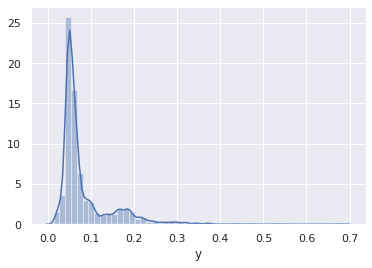

In [7]:
sns.distplot(train['y'])

In [8]:
# galaxies with low existence expectancy index below 0.7
gl_train = (train['existence expectancy index'] <= 0.7).sum()
gl_test = (test['existence expectancy index'] <= 0.7).sum()
print('Train nbr of galaxies with low existence expectancy index below 0.7: ',
      gl_train, 'represents', round(gl_train/len(train) * 100) , '%')
print('Test nbr of galaxies with low existence expectancy index below 0.7: : ',
      gl_test, 'represents',round(gl_test/len(test) * 100), '%')
print()
# how many galactic years ?
print('Train galactic years:', train['galactic year'].unique(), 
      ' = > length:', len(train['galactic year'].unique()),
     ', ascending: ', train['galactic year'].unique().tolist() == sorted(train['galactic year'].unique().tolist()))
print()

# how many galaxies ?
print('nbr galaxies in train:', len(train['galaxy'].unique()))
print('nbr galaxies in test:', len(test['galaxy'].unique()))
print()

# galaxies_train != galaxies_test
print("galaxies_train != galaxies_test =>", [galaxy for galaxy in test['galaxy'] if galaxy in train['galaxy']])

# galactic year ?
print("galactic year (train, test) ? => ",
      [galaxy for galaxy in test['galactic year'] if galaxy in train['galactic year']])
print()
print('(Submission)Test galactic years:', test['galactic year'].unique(), 
      ' = > length:', len(test['galactic year'].unique()),
     ', ascending: ', test['galactic year'].unique().tolist() == sorted(test['galactic year'].unique().tolist()))
print()
print('Test list galactic years ⊂ Train list galactic years: ',
     all(year for year in test['galactic year'].unique() if year in train['galactic year'].unique()))

Train nbr of galaxies with low existence expectancy index below 0.7:  677 represents 18.0 %
Test nbr of galaxies with low existence expectancy index below 0.7: :  66 represents 7.0 %

Train galactic years: [ 990025  991020  992016  993012  994009  995006  996004  997002  998001
  999000 1000000 1001000 1002001 1003002 1004004 1005006 1006009 1007012
 1008016 1009020 1010025 1011030 1012036 1013042 1014049 1015056]  = > length: 26 , ascending:  True

nbr galaxies in train: 181
nbr galaxies in test: 172

galaxies_train != galaxies_test => []
galactic year (train, test) ? =>  []

(Submission)Test galactic years: [1007012 1008016 1013042 1012036 1011030 1009020 1010025 1015056 1014049
 1016064]  = > length: 10 , ascending:  False

Test list galactic years ⊂ Train list galactic years:  True


## Relative Analysis (galaxies)

In [9]:
# nbr of galactic years recorded for each galaxy
galaxies = train.groupby('galaxy')
galactic_year_cout = galaxies.agg(['count'])['galactic year']
print("min count:", galactic_year_cout.min()[0], "| mean:", galactic_year_cout.mean()[0],
     "| max:", galactic_year_cout.max()[0])
galactic_year_cout

min count: 1 | mean: 21.353591160220994 | max: 26


,count
galaxy,
Andromeda Galaxy (M31),18
Andromeda I,18
Andromeda II,25
Andromeda III,18
Andromeda IX,18
...,...
Ursa Major II Dwarf,24
Ursa Minor Dwarf,24
Virgo I,24


In [10]:
# stats for the target 'y' for each galaxy (over galactic years 990025-1015056)
galaxies.agg(['min', 'mean', 'max', 'var'])['y']

,min,mean,max,var
galaxy,,,,
Andromeda Galaxy (M31),0.016824,0.043539,0.049214,0.000054
Andromeda I,0.025844,0.049126,0.053204,0.000037
Andromeda II,0.143884,0.176689,0.191913,0.000164
Andromeda III,0.110758,0.117387,0.137202,0.000039
Andromeda IX,0.151314,0.166813,0.285940,0.000925
...,...,...,...,...
Ursa Major II Dwarf,0.181483,0.190628,0.204002,0.000039
Ursa Minor Dwarf,0.028505,0.051538,0.058064,0.000047
Virgo I,0.018371,0.042337,0.050449,0.000056


In [11]:
# Evolution of the index (y) and the other features for each galaxy over galactic years

columns = [col for col in train.columns if col not in ['y', 'galactic year', 'galaxy']]
@interact
def evolution_target_index_galaxies(galaxy_name=galaxies.groups.keys(),
                                   features=columns,
                                   poly_deg=range(10)):
    group = galaxies.get_group(galaxy_name)
    coeffs = np.polyfit(group['galactic year'], group['y'], deg=poly_deg)
    poly = np.poly1d(coeffs)
    plt.figure(figsize=(9, 5))
    plt.plot(group['galactic year'], poly(group['galactic year']), color='red', linestyle='--')
    plt.plot(group['galactic year'], group['y'], color='black')
    plt.legend([f"polynomial deg {poly_deg}", "y"])
    #group.plot(x='galactic year', y='y', figsize=(9, 5))
    group.plot(x='galactic year', y=features, figsize=(9, 5), color='orange')

# The evolution of the index (y) over galactic years, can be approximeted as we can see for many galaxies with
# a polynomial approximation with degre (4 or 5)

interactive(children=(Dropdown(description='galaxy_name', options=('Andromeda Galaxy (M31)', 'Andromeda I', 'A…

In [12]:
# correlations between features for each galaxy

@interact
def correlation(galaxy_name=galaxies.groups.keys()):
    
    group = galaxies.get_group(galaxy_name)
    group = group[[col for col in group.columns if col not in ['galactic year', 'galaxy']]]
    corr = group.corr()
    c = corrplot.Corrplot(corr)
    fig = plt.figure(figsize=(20, 15))
    c.plot(fig=fig, colorbar=False, method='circle', shrink=.7, lower='circle')

interactive(children=(Dropdown(description='galaxy_name', options=('Andromeda Galaxy (M31)', 'Andromeda I', 'A…

In [13]:
# features correlations with the target "y" for each galaxy
@interact
def corr_with_target(galaxy_name=galaxies.groups.keys()):
    
    group = galaxies.get_group(galaxy_name)
    group = group[[col for col in group.columns if col not in ['galactic year', 'galaxy']]]
    corr = group.corr()['y']
    corr.plot(kind='bar',
              figsize=(25, 9),
              fontsize=20
             )

interactive(children=(Dropdown(description='galaxy_name', options=('Andromeda Galaxy (M31)', 'Andromeda I', 'A…

In [14]:
# nan values for each galaxy /!\
@interact
def nan_values_galaxies(galaxy_name=galaxies.groups.keys()):
    group = galaxies.get_group(galaxy_name)
    group = group[[col for col in group.columns if col not in ['galaxy', 'galactic year']]]
    pct_nan = group.isnull().sum() / len(group)
    pct_nan.plot(kind='bar', figsize=(20, 9), color='red', fontsize=15)

interactive(children=(Dropdown(description='galaxy_name', options=('Andromeda Galaxy (M31)', 'Andromeda I', 'A…

## Abosulute Analysis

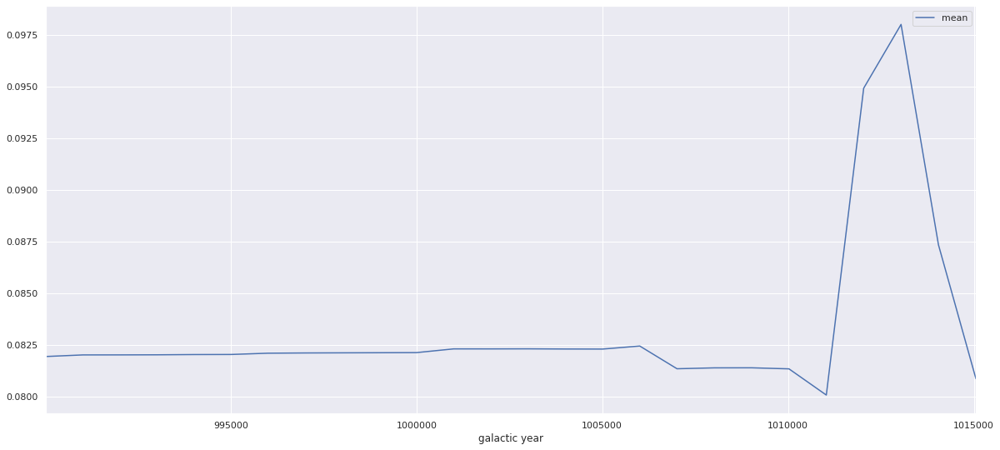

In [16]:
# evolution of the index target (y) over galactic years, by taking the mean of y
# over recorded galaxies of the year.
galactic_year = train.groupby('galactic year')
galactic_year.agg(['mean'])['y'].plot(figsize=(20, 9))

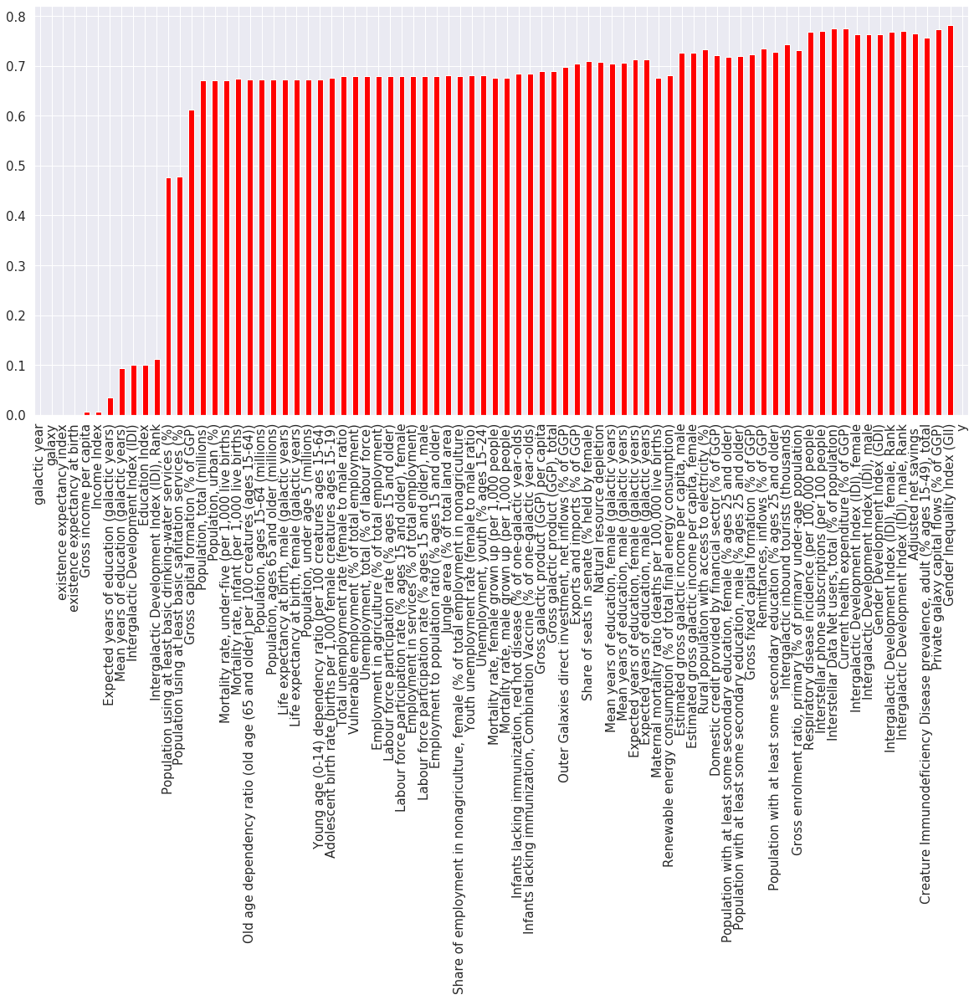

In [17]:
# nan values
pct_nan = train.isnull().sum() / len(train)
pct_nan.plot(kind='bar', figsize=(20, 9), color='red', fontsize=15)

# the dataset contains a lot of missing values.
# the pct(%) of missing values is almost the same for some features !!

In [15]:
# correlation between features
columns = [col for col in train.columns if col not in ['galactic year', 'galaxy']]
@interact
def scatter_corr(x_axis=columns,
                 y_axis=columns,
                poly_deg=range(10)):
    x, y = train[x_axis].values, train[y_axis].values
    idx = np.isfinite(x) & np.isfinite(y)
    coeffs = np.polyfit(x[idx], y[idx], deg=poly_deg)
    poly = np.poly1d(coeffs)
    plt.figure(figsize=(20, 9))
    plt.plot(x, poly(x), color='red')
    plt.scatter(train[x_axis], train[y_axis])

# For the correlation between features that can be approximated by a (polynomial,...) we can think of imputing
# nan values with this approximation for some features.
# OR droping some features to reduce the features space
# Example: 
    # existence expectancy index VS existence expectancy at birth
    # Income Index VS Gross Income per capita
    # Mean years of education (galactic years) VS Expected years of education (galactic years) VS Education Index 

interactive(children=(Dropdown(description='x_axis', options=('existence expectancy index', 'existence expecta…

### existence expectancy index VS existence expectancy at birth

In [189]:
train[['existence expectancy at birth', 'existence expectancy index']].isnull().sum()

existence expectancy at birth    1
existence expectancy index       1
dtype: int64

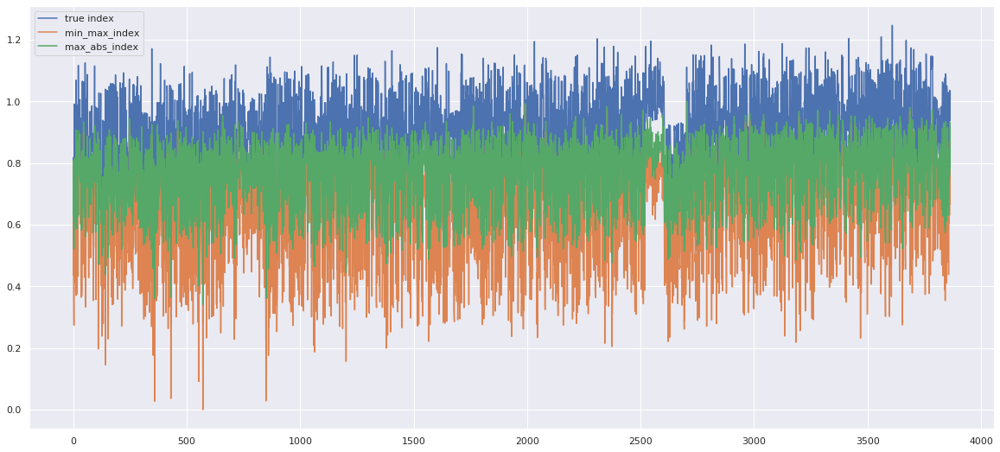

In [171]:
# existence expectancy index VS existence expectancy at birth
from sklearn.preprocessing import MinMaxScaler, StandardScaler, MaxAbsScaler

min_max_scaler = MinMaxScaler()
index1 = min_max_scaler.fit_transform(train['existence expectancy at birth'].values.reshape(-1, 1))

standard_scaler = StandardScaler()
index2 = standard_scaler.fit_transform(train['existence expectancy at birth'].values.reshape(-1, 1))

max_abs_scaler = MaxAbsScaler()
index3 = max_abs_scaler.fit_transform(train['existence expectancy at birth'].values.reshape(-1, 1))


plt.figure(figsize=(20, 9))
plt.plot(train['existence expectancy index'])
plt.plot(index1)
#plt.plot(index2)
plt.plot(index3)
plt.legend(['true index', 'min_max_index', 'max_abs_index'])

# as we can see existence expectancy index is almost a scaling (MaxAbsScaler) of existence expectancy at birth

### Mean years of education (galactic years) VS Expected years of education (galactic years) VS  Education Index

In [172]:
# Mean years of education (galactic years) VS Expected years of education (galactic years) VS 
# Education Index
train[['Mean years of education (galactic years)', 'Expected years of education (galactic years)',
      'Education Index']].isnull().sum()

Mean years of education (galactic years)        363
Expected years of education (galactic years)    133
Education Index                                 391
dtype: int64

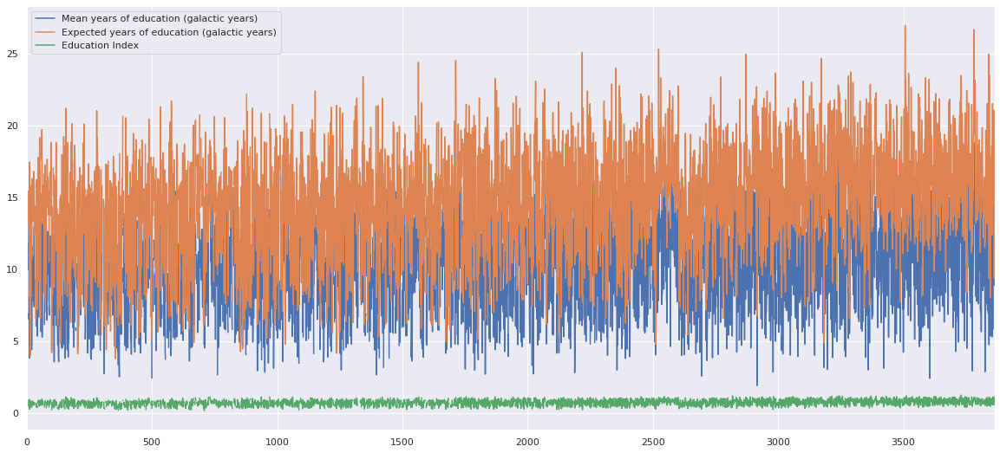

In [173]:

education_data = train[['Mean years of education (galactic years)',
                        'Expected years of education (galactic years)',
                        'Education Index']]
education_data.plot(figsize=(20, 9))

In [174]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler

In [175]:
education_data = education_data.dropna()
education_data.isnull().sum()

Mean years of education (galactic years)        0
Expected years of education (galactic years)    0
Education Index                                 0
dtype: int64

In [176]:
# https://bizfluent.com/how-4894211-calculate-human-development-index.html
approx = education_data['Mean years of education (galactic years)'] / education_data['Expected years of education (galactic years)']
((education_data['Education Index'] - approx)**2).sum() / len(education_data)

0.04574138124068339

In [177]:
X_educa, Y_educa = education_data[['Mean years of education (galactic years)',
                                   'Expected years of education (galactic years)']], education_data['Education Index']
scaler = StandardScaler()
X_educa = scaler.fit_transform(X_educa)

In [178]:
X_train, X_test, y_train, y_test = train_test_split(X_educa, Y_educa,
                                                    test_size=0.33,
                                                    random_state=42)
X_train.shape, X_test.shape

((2327, 2), (1147, 2))

In [179]:
educa_linear_rg = LinearRegression(fit_intercept=True, normalize=False)
educa_linear_rg.fit(X_train, y_train)
y_pred = educa_linear_rg.predict(X_test)
print('linear rg => mse: ', mean_squared_error(y_test, y_pred))

educa_rf = RandomForestRegressor()
educa_rf.fit(X_train, y_train)
y_pred = educa_rf.predict(X_test)
print('RandomForest rg => mse: ', mean_squared_error(y_test, y_pred))

educa_svr = SVR(C=1.0, epsilon=0.2)
educa_svr.fit(X_train, y_train)
y_pred = educa_svr.predict(X_test)
print('SVR rg => mse: ', mean_squared_error(y_test, y_pred))

# As we can see, maybe we can impute one of these 3 features about education, with a linear formula of the 2 others  

linear rg => mse:  0.006110748159856041
RandomForest rg => mse:  0.007350551688148948
SVR rg => mse:  0.006929350807584587


### Income Index VS Gross income per capita

In [225]:
# https://bizfluent.com/how-4894211-calculate-human-development-index.html | GREAT RESOURCE :) 
# Income Index = C1 * log(Gross income per capita) + C2
# C1 =? 1 / log(max/min)  |  C2 =? C1 * log(min)

income_data = train[['Gross income per capita', 'Income Index']]
income_data.isnull().sum()

Gross income per capita    28
Income Index               28
dtype: int64

In [227]:
income_data = income_data.dropna(inplace=False)
log_gross_income = np.log(income_data['Gross income per capita'])
idx = np.isfinite(log_gross_income)
log_gross_income = log_gross_income[idx]

In [231]:
coeffs = np.polyfit(log_gross_income, income_data['Income Index'].values[idx], deg=1)
poly = np.poly1d(coeffs)
print('coeffs', coeffs)
print('poly: ', poly)

coeffs [ 0.27416053 -1.97727802]
poly:   
0.2742 x - 1.977


Text(0, 0.5, 'Income Index')

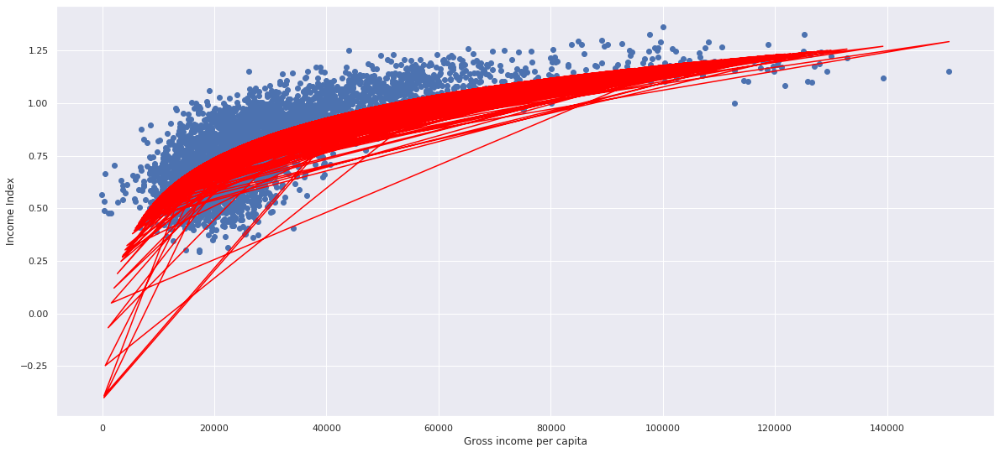

In [229]:
plt.figure(figsize=(20, 9))
plt.plot(income_data['Gross income per capita'], poly(np.log(income_data['Gross income per capita'])), color="red")
plt.scatter(income_data['Gross income per capita'], income_data['Income Index'])
plt.xlabel('Gross income per capita')
plt.ylabel('Income Index')

## Next Step: Take into account Just "Index" features
### As we can see in the dataset, we have a lot of features that represents some relationship  to their indexes (same category), so Why not take into accout just these indexes to predict the target index y, because maybe these indexes contain all the signal needed to predict y.

In [239]:
index_features = [col for col in train.columns if 'index' in col.lower()] + ['y']

index_data = train[index_features]
index_data.head()

,existence expectancy index,Income Index,Intergalactic Development Index (IDI),Education Index,"Intergalactic Development Index (IDI), Rank","Intergalactic Development Index (IDI), female","Intergalactic Development Index (IDI), male",Gender Development Index (GDI),"Intergalactic Development Index (IDI), female, Rank","Intergalactic Development Index (IDI), male, Rank",Gender Inequality Index (GII),y
0,0.628657,0.646039,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.052590
1,0.818082,0.852246,0.833624,0.467873,152.522198,NaN,NaN,NaN,NaN,NaN,NaN,0.059868
2,0.659443,0.499762,0.469110,0.363837,209.813266,NaN,NaN,NaN,NaN,NaN,NaN,0.050449
3,0.555862,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.049394
4,0.991196,1.131163,0.910341,0.918353,71.885345,NaN,NaN,NaN,NaN,NaN,NaN,0.154247
